In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=True, fontsize=20, figsize=(12, 12))

perinectoric_gene_list = ["CD44"]
# necrosis_gene_list = ["PGK1", "NDRG1", "HK2", "TNFAIP3", "ANGPTL4", "LIF", "IDS"]
necrosis_gene_list = ["PGK1", "NDRG1", "HK2", "ANGPTL4", "IDS"]
# necrosis_gene_list = ["PGK1", "NDRG1", "HK2"]
infiltrating_gene_list = ["SLC20A2", "GABBR2", "HS6ST1", "RARRES1", "ATP1B1"]
# perivascular_zone = ["NALF1", "PDE4D", "MAST4"]
perivascular_zone = [ "PDE4D", "MAST4"]

ct_gene_list = ["IGFBP2", "TIMP1", "EZH2"]
leading_edge = ["BIRC5", "CCNB2", "CCNB1"]
microvascular1 = ["NOSTRIN", "MKI67"]
microvascular2 = ["MAST4", "PECAM1",  "PXDN"]

genes_list = necrosis_gene_list  + ct_gene_list + leading_edge + microvascular2
# genes_list = necrosis_gene_list + ct_gene_list + infiltrating_gene_list + microvascular2 + leading_edge
# ensure gnees are unique
# genes_list = list(set(genes_list))



/Users/shaunie/Desktop/hu-glioblastoma/.conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.6 anndata==0.10.4 umap==0.5.5 numpy==1.26.3 scipy==1.11.4 pandas==2.1.4 scikit-learn==1.3.2 statsmodels==0.14.1 igraph==0.10.8 louvain==0.8.1 pynndescent==0.5.11


In [33]:
# adata = sc.read('write/human_combined_3.h5ad')
adata = sc.read('write/final_concat.h5ad')


/Users/shaunie/Desktop/hu-glioblastoma/.conda/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/Users/shaunie/Desktop/hu-glioblastoma/.conda/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/shaunie/Desktop/hu-glioblastoma/.conda/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


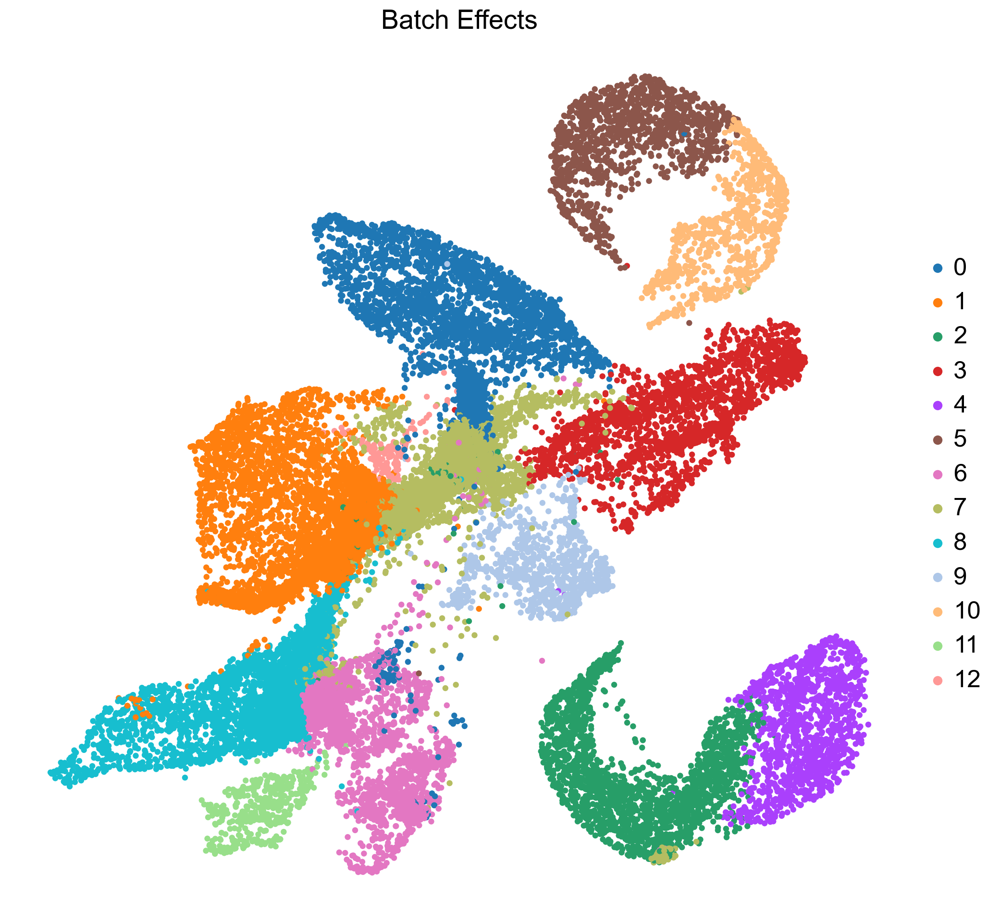

In [34]:
sc.pl.umap(adata, color=['louvain'], frameon=False, size=80, title="Batch Effects")


In [35]:
# sc.pl.umap(adata, color=['louvain'], frameon=False, size=80, title="clusters")
# 0 is Infiltarating
# 1 is Mixed
# 2 is Necrotic
# 3 is Leading Edge
# 4 is Central Core
# 5 is Mixed
# 6 is Central Core
# 7 is Necrotic
# 8 is Nectoric
# 9 is Vascular
# 10 is Mixed



In [36]:
# sc.pl.tsne(adata, color=['batch'], size=80, title="Batch Effects")

In [37]:
necrosis_data = adata[:, necrosis_gene_list].X
gene_num = len(necrosis_gene_list)
necrosis_expression = np.sum(necrosis_data, axis=1) / gene_num
necrosis_expression = pd.DataFrame(necrosis_expression)

perinectoric_data = adata[:, perinectoric_gene_list].X
gene_num = len(perinectoric_gene_list)
perinectoric_expression = np.sum(perinectoric_data, axis=1) / gene_num
perinectoric_expression = pd.DataFrame(perinectoric_expression)

infiltrating_data = adata[:, infiltrating_gene_list].X
gene_num = len(infiltrating_gene_list)
infiltrating_expression = np.sum(infiltrating_data, axis=1) / gene_num
infiltrating_expression = pd.DataFrame(infiltrating_expression)

perivascular_data = adata[:, perivascular_zone].X
gene_num = len(perivascular_zone)
perivascular_expression = np.sum(perivascular_data, axis=1) / gene_num
perivascular_expression = pd.DataFrame(perivascular_expression)

ct_data = adata[:, ct_gene_list].X
gene_num = len(ct_gene_list)
ct_expression = np.sum(ct_data, axis=1) / gene_num
ct_expression = pd.DataFrame(ct_expression)

leading_edge_data = adata[:, leading_edge].X
gene_num = len(leading_edge)
leading_edge_expression = np.sum(leading_edge_data, axis=1) / gene_num
leading_edge_expression = pd.DataFrame(leading_edge_expression)

microvascular_data1 = adata[:, microvascular1].X
gene_num = len(microvascular1)
microvascular_expression1 = np.sum(microvascular_data1, axis=1) / gene_num
microvascular_expression1 = pd.DataFrame(microvascular_expression1)
adata.obs["m1"] = pd.Series(microvascular_expression1[0].values, index=adata.obs.index)


microvascular_data2 = adata[:, microvascular2].X
gene_num = len(microvascular2)
microvascular_expression2 = np.sum(microvascular_data2, axis=1)
microvascular_expression2 = pd.DataFrame(microvascular_expression2)
adata.obs["m2"] = pd.Series(microvascular_expression2[0].values, index=adata.obs.index)

# for i in genes_list:
#     adata.obs[i] = pd.Series(adata[:, i].X.toarray()[:, 0], index=adata.obs.index)



In [38]:
# add to adata
adata.obs["necrosis"] = pd.Series(necrosis_expression[0].values, index=adata.obs.index)
adata.obs["perinectoric"] = pd.Series(perinectoric_expression[0].values, index=adata.obs.index)
adata.obs["infiltrating"] = pd.Series(infiltrating_expression[0].values, index=adata.obs.index)
adata.obs["perivascular"] = pd.Series(perivascular_expression[0].values, index=adata.obs.index)
adata.obs["ct"] = pd.Series(ct_expression[0].values, index=adata.obs.index)
adata.obs["leading_edge"] = pd.Series(leading_edge_expression[0].values, index=adata.obs.index)
adata.obs["m2"] = pd.Series(microvascular_expression2[0].values, index=adata.obs.index)

adata.obs

,cell_type,batch,louvain,sample_type,clusters,cell_type_2,cell_type_3,size,m1,m2,necrosis,perinectoric,infiltrating,perivascular,ct,leading_edge
AAACCCAAGAAGGTAG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,Stem Cells (Mesenchymal),NaN,5,0.0,0.0,2.4,3.0,0.4,0.0,0.666667,0.0
AAACCCAAGACCTCCG-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,Stem Cells (Mesenchymal),NaN,5,0.0,0.0,4.4,0.0,0.2,0.0,0.000000,0.0
AAACCCACAACTTGGT-1-SF10022-ref,Neoplastic_cell/proneural,ref,1,NaN,NaN,Stem Cells (Mesenchymal),NaN,5,0.0,1.0,0.6,0.0,1.0,0.0,0.000000,0.0
AAACCCAGTCTACGAT-1-SF10022-ref,Oligodendrocyte,ref,2,NaN,NaN,Oligodendyrocye-like,NaN,5,0.0,3.0,0.8,0.0,0.6,4.5,0.000000,0.0
AAACCCAGTTATCTTC-1-SF10022-ref,Neoplastic_cell/mesenchymal,ref,1,NaN,NaN,Stem Cells (Mesenchymal),NaN,5,0.0,1.0,0.4,37.0,2.6,3.0,0.666667,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTTGC-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,35,Endothelial,Rat Endothelial,10,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
TTTGTTGGTGTAGTGG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,16,Endothelial,Rat Endothelial,10,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
TTTGTTGTCCATACTT-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,18,Endothelial,Rat Endothelial,10,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
TTTGTTGTCCCAAGCG-1-1919d_rat-1919-new,NaN,new,0,1919d_rat-1919,24,Endothelial,Rat Endothelial,10,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [39]:
# flip Umap1
adata.obsm['X_umap'][:,0] = -1*adata.obsm['X_umap'][:,0]
# flip Umap2
adata.obsm['X_umap'][:,1] = -1*adata.obsm['X_umap'][:,1]

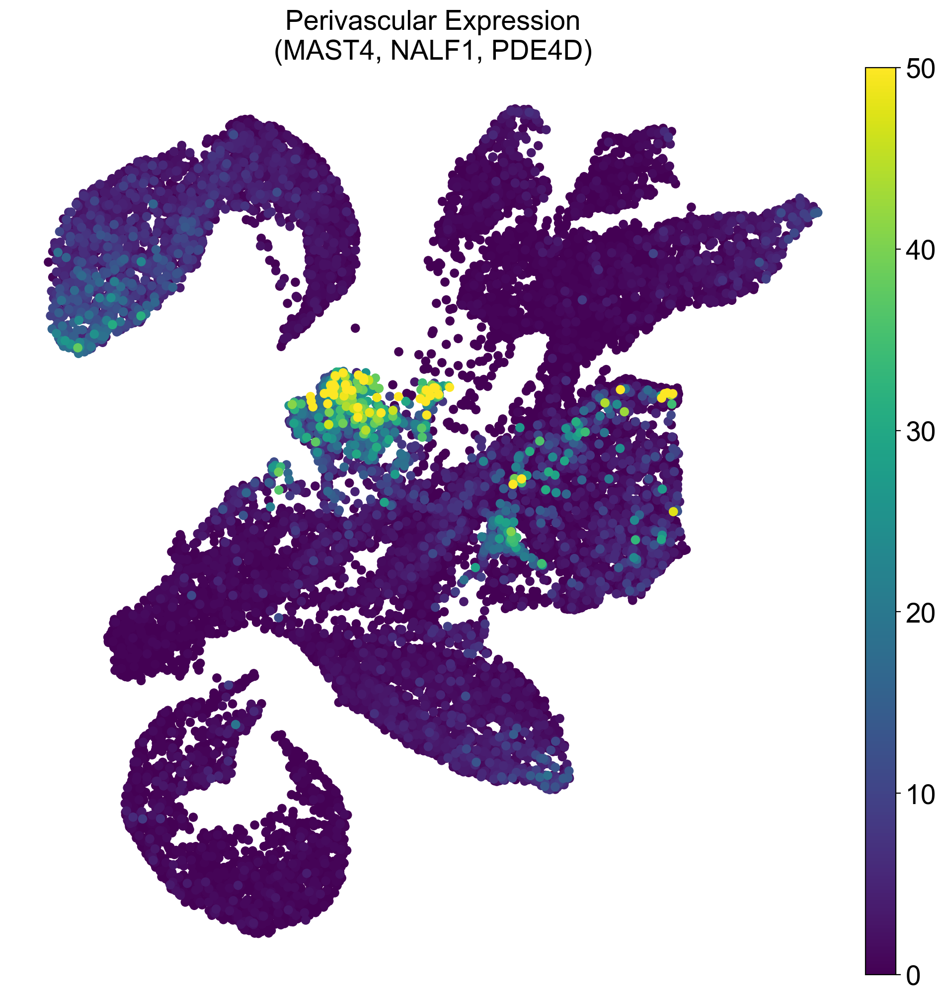

In [40]:
sc.pl.umap(adata, color=['perivascular'], frameon=False, size=180, vmax=50, title="Perivascular Expression\n(MAST4, NALF1, PDE4D)")
# plt.savefig('figures/perivascular_expression.png', dpi=300, bbox_inches='tight')

In [41]:
# sc.pl.tsne(adata, color=['perivascular'], frameon=False, size=80, vmax=10, title="Perivascular Expression\n(MAST4, NALF1, PDE4D)")

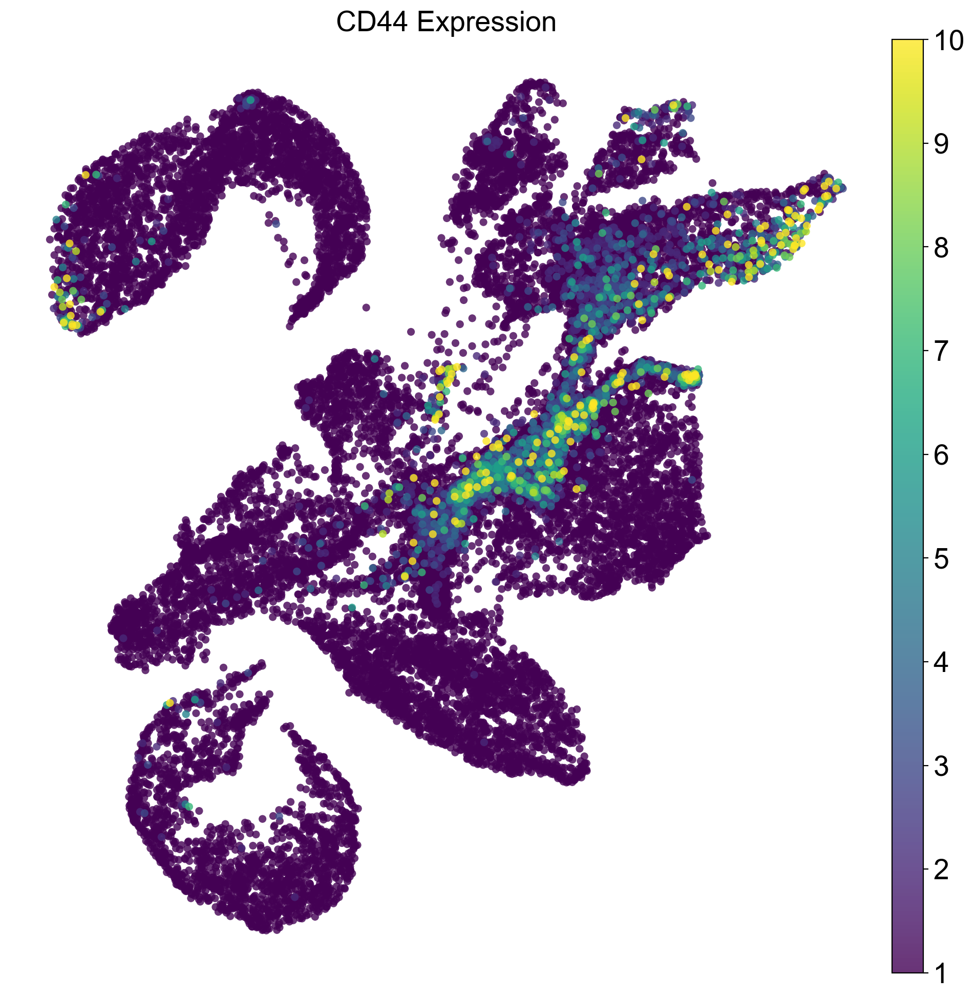

In [42]:
sc.pl.umap(adata, color=["CD44"], frameon=False, size=120, alpha=0.8, vmax=10, vmin=1, title="CD44 Expression")
# save figure to file
# plt.savefig('figures/CD44_expression.png', dpi=300, bbox_inches='tight')

In [43]:
# sc.pl.tsne(adata, color=["CD44"], frameon=False, size=150, vmax=6, vmin=2, title="CD44 Expression")


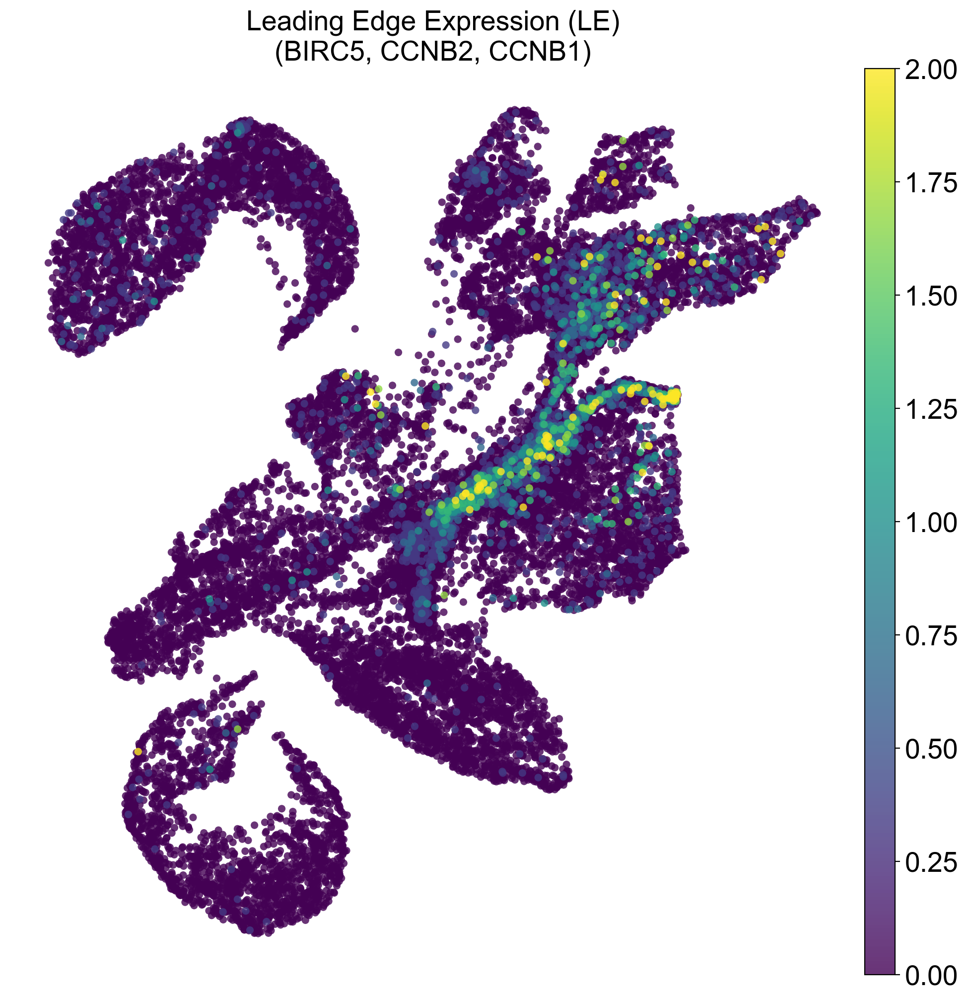

In [44]:

# include subtitle to write BIRC5, CCNB2, CCNB1
sc.pl.umap(adata, color=['leading_edge'], frameon=False, size=120, alpha=0.8, vmin=0, vmax=2, title="Leading Edge Expression (LE)\n(BIRC5, CCNB2, CCNB1)")
# plt.savefig('figures/leading_edge_expression.png', dpi=300, bbox_inches='tight')

In [45]:
# sc.pl.tsne(adata, color=['leading_edge'], frameon=False, size=150, vmin=0, vmax=10, title="Leading Edge Expression (LE)\n(BIRC5, CCNB2, CCNB1)")


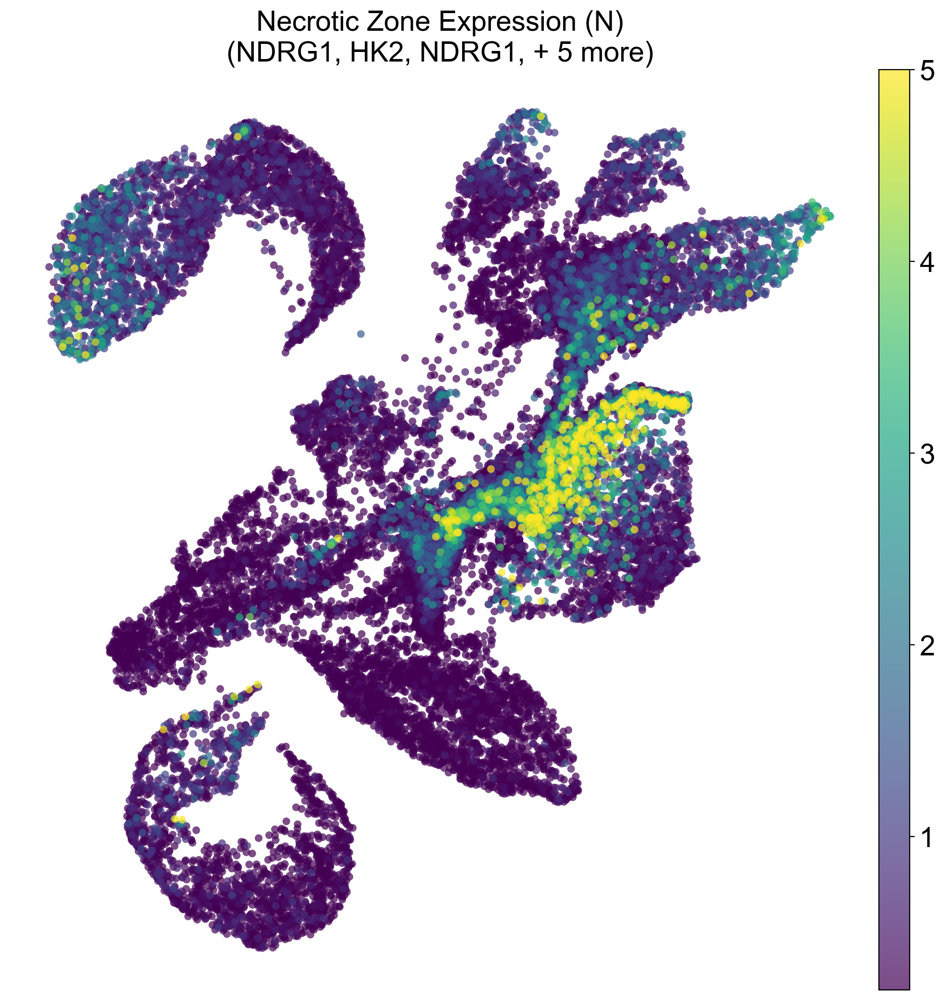

In [46]:
sc.pl.umap(adata, color='necrosis', frameon=False , size=120, vmin=0.2, vmax=5, alpha=0.7, title="Necrotic Zone Expression (N)\n(NDRG1, HK2, NDRG1, + 5 more)")
# plt.savefig('figures/necrosis_expression.png', dpi=300, bbox_inches='tight')

In [47]:
# sc.pl.tsne(adata, color='necrosis', frameon=False , size=150, vmin=1, title="Necrotic Zone Expression (N)\n(NDRG1, HK2, NDRG1, + 5 more)")

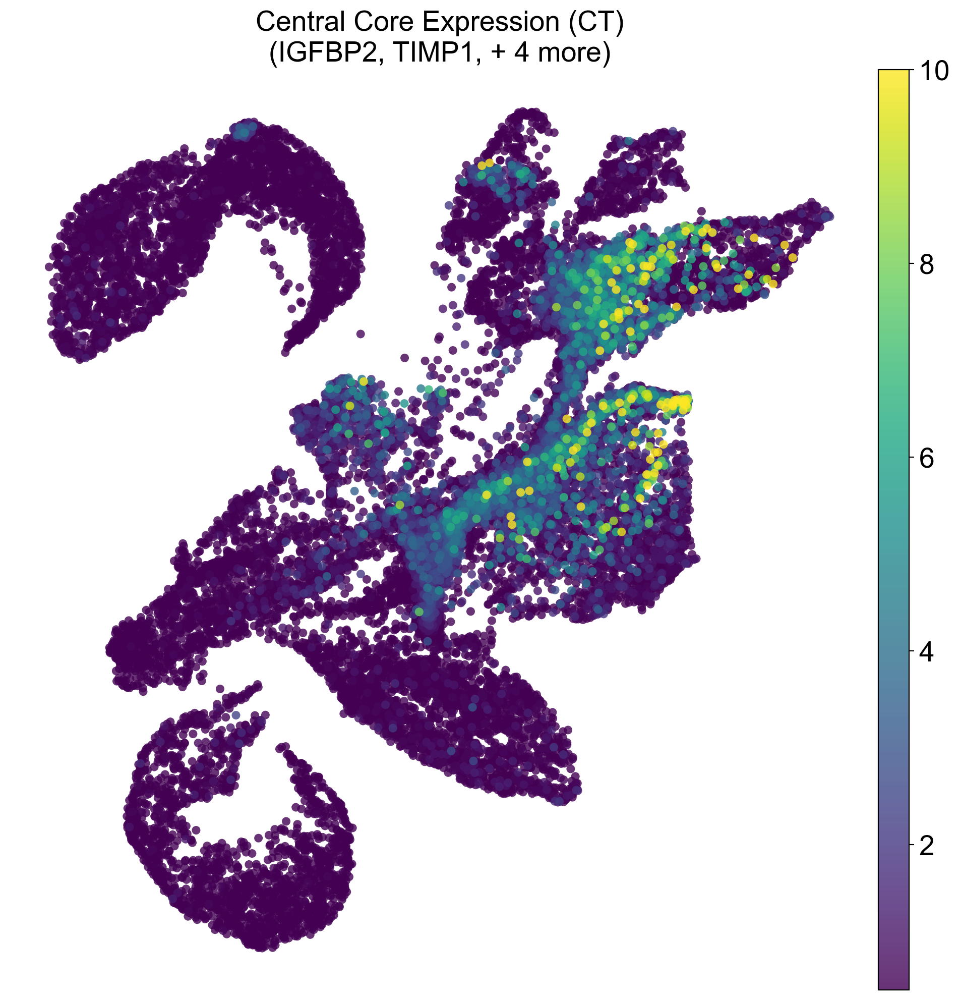

In [48]:
sc.pl.umap(adata, color='ct', frameon=False , vmin=0.5, vmax=10, size=150, alpha=0.8, title="Central Core Expression (CT)\n(IGFBP2, TIMP1, + 4 more)" , cmap="viridis")
# plt.savefig('figures/ct_expression.png', dpi=300, bbox_inches='tight')

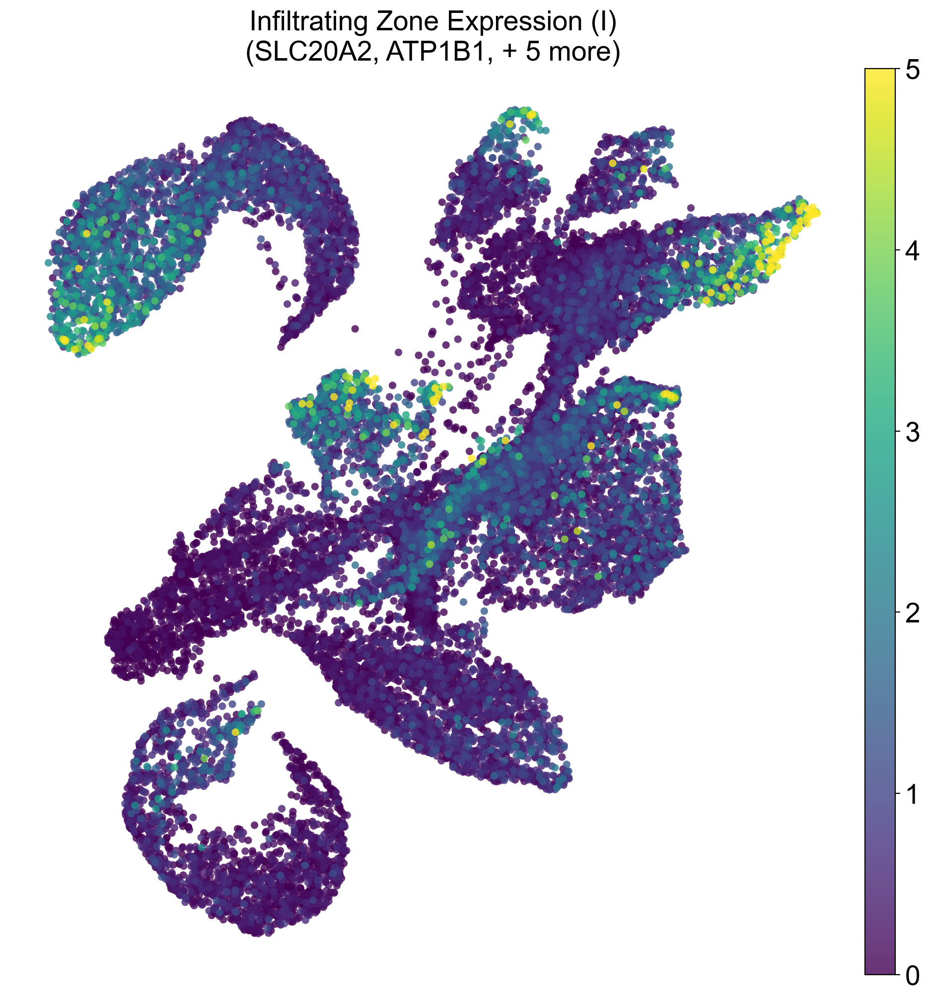

<Figure size 1200x1200 with 0 Axes>

In [49]:
sc.pl.umap(adata, color='infiltrating', frameon=False , size=120, alpha=0.8, vmax=5, vmin=0, title="Infiltrating Zone Expression (I)\n(SLC20A2, ATP1B1, + 5 more)", cmap="viridis")
plt.savefig('figures/infiltrating_expression.png', dpi=300, bbox_inches='tight')

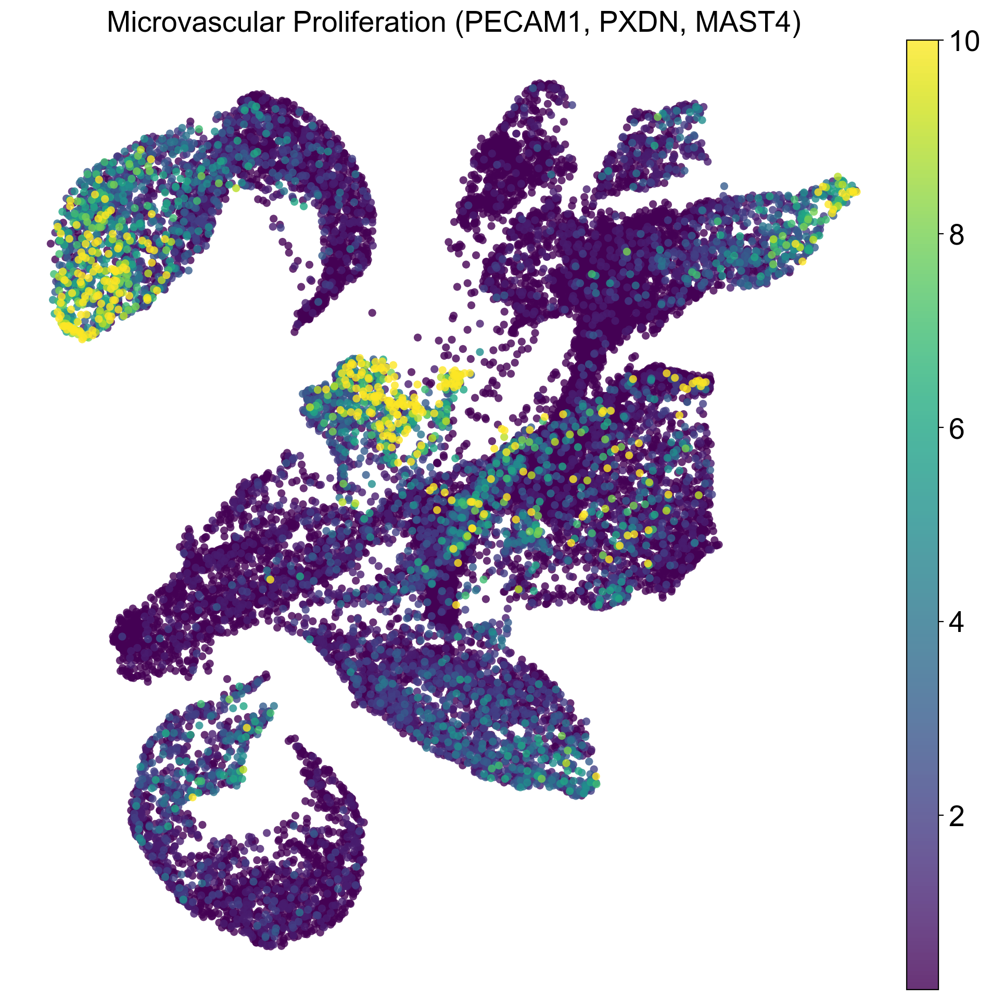

<Figure size 1200x1200 with 0 Axes>

In [50]:
sc.pl.umap(adata, color=['m2'], frameon=False, size=120, alpha=0.8, vmin=0.2, vmax=10, title="Microvascular Proliferation (PECAM1, PXDN, MAST4)", cmap="viridis")
plt.savefig('figures/microvascular_proliferation.png', dpi=300, bbox_inches='tight')


In [51]:
adata2 = adata.copy()


In [52]:
adata = adata2.copy()

In [67]:
# if perivascular if over 3.5, label class "perivascular"
adata.obs["class"] = 'other'
# adata.obs["class"] = np.where(adata.obs['perinectoric'] > 8, "perinectoric", adata.obs["class"])
adata.obs["class"] = np.where(adata.obs['necrosis'] > 0.2, "necrosis", adata.obs["class"])
adata.obs["class"] = np.where(adata.obs['infiltrating'] > 0.2, "infiltrating", adata.obs["class"])
adata.obs["class"] = np.where(adata.obs['perivascular'] > 1, "perivascular", adata.obs["class"])
adata.obs["class"] = np.where(adata.obs['ct'] > 0.4, "ct", adata.obs["class"])
adata.obs["class"] = np.where(adata.obs['leading_edge'] > 0.05, "leading_edge", adata.obs["class"])
adata.obs["class"] = np.where(adata.obs['m2'] > 0.1, "m2", adata.obs["class"])

# drop everything other
# adata = adata[adata.obs["class"] != "other", :]

adata.obs["class"] = pd.Categorical(adata.obs["class"], categories=["perinectoric", "necrosis", "infiltrating", "ct", "leading_edge", "m2","perivascular", "other"])


/Users/shaunie/Desktop/hu-glioblastoma/.conda/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/shaunie/Desktop/hu-glioblastoma/.conda/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


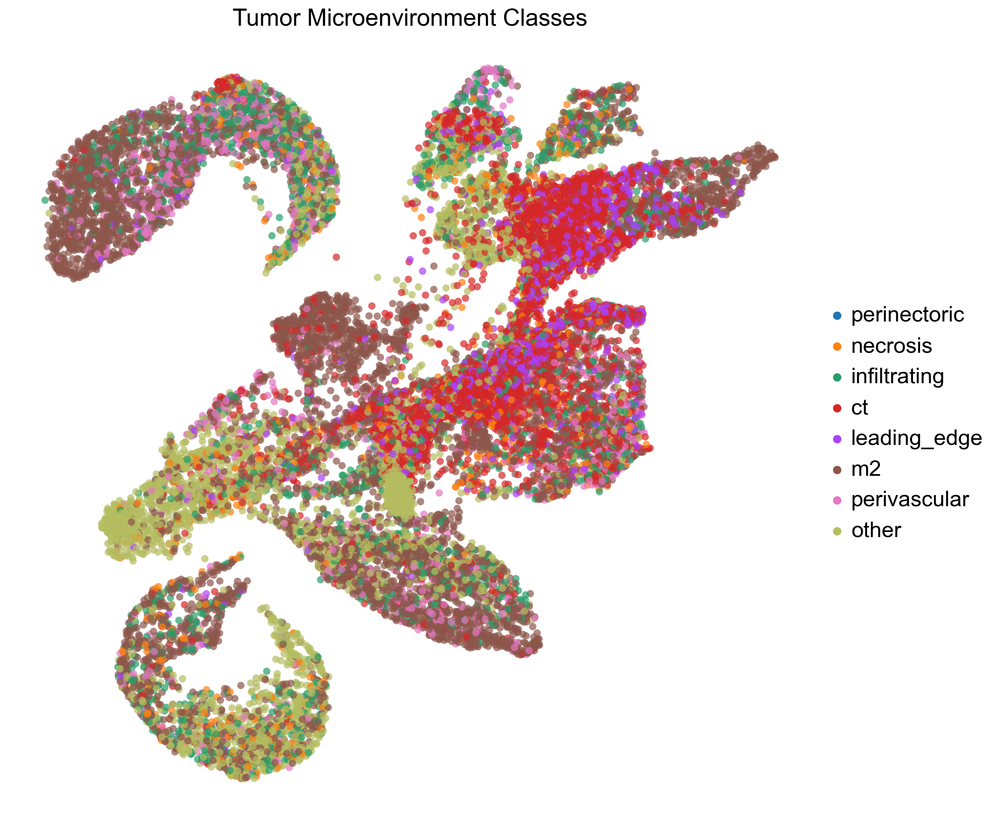

In [68]:
sc.pl.umap(adata, color='class', frameon=False, size=150, alpha=0.7, title="Tumor Microenvironment Classes")

In [ ]:
lut = dict(zip(adata.obs['class'].unique(), "rbgwcmyp"))
lut

{'infiltrating': 'r',
 'necrosis': 'b',
 'ct': 'g',
 'leading_edge': 'w',
 'm2': 'c',
 'perivascular': 'm'}

In [ ]:
# # create a list of gene lists
# gene_lists = [perinectoric_gene_list, necrosis_gene_list, infiltrating_gene_list, perivascular_zone, ct_gene_list, leading_edge, microvascular2]
# names = ["perinectoric", "necrosis", "infiltrating", "perivascular", "ct", "leading_edge", "microvascular2"]
# # big_df = pd.DataFrame()
# # loop over each gene list
# for gene_list in gene_lists:
#     # create a dataframe with the gene expression data for each cluster
#     df = pd.DataFrame()
#     for i in range(adata.obs['louvain'].nunique()):
#         cluster = adata.obs['louvain'].unique()[i]
#         count = adata.obs['count'].unique()[i]     
#         expression = np.log(np.mean(adata[adata.obs['louvain'] == cluster, gene_list].X, axis=0) + 1)
#         # normalize expression
#         df[cluster] = expression
#         df['count'] = cluster
#     df = df.T
#     df.columns = gene_list
#     df = df.reindex(['9', '3','0','1', '2', '7', '8', '5', '6', '4',])
#     df = df.reindex(['9', '3','4','6', '10', '5', '0', '1', '8', '7','2'])


#     df.plot(kind='bar', color=sns.color_palette("viridis"), figsize=(10, 5), width=1)
#     # make width dependent on number of cells in cluster


#     # move legends outside of plot
#     plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     # label the genes   
#     # no axis
#     # plt.axis('off')
    

    








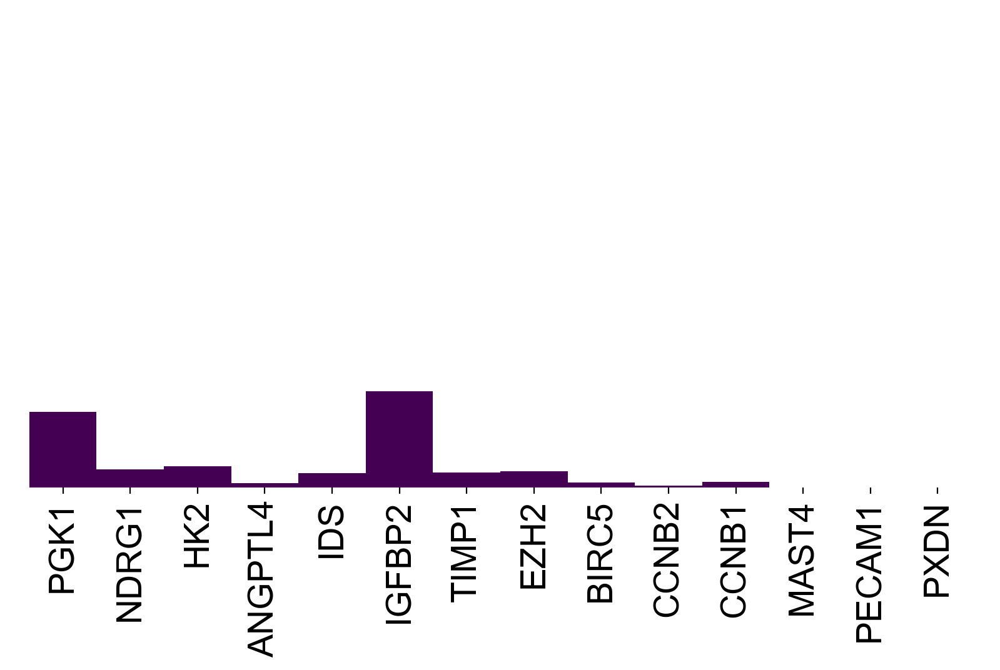

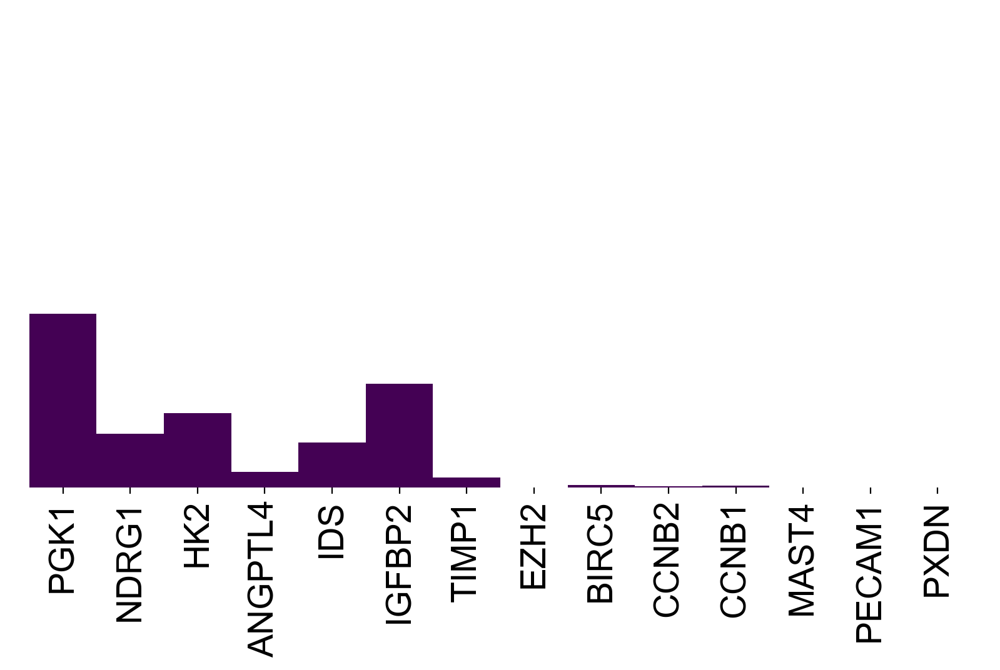

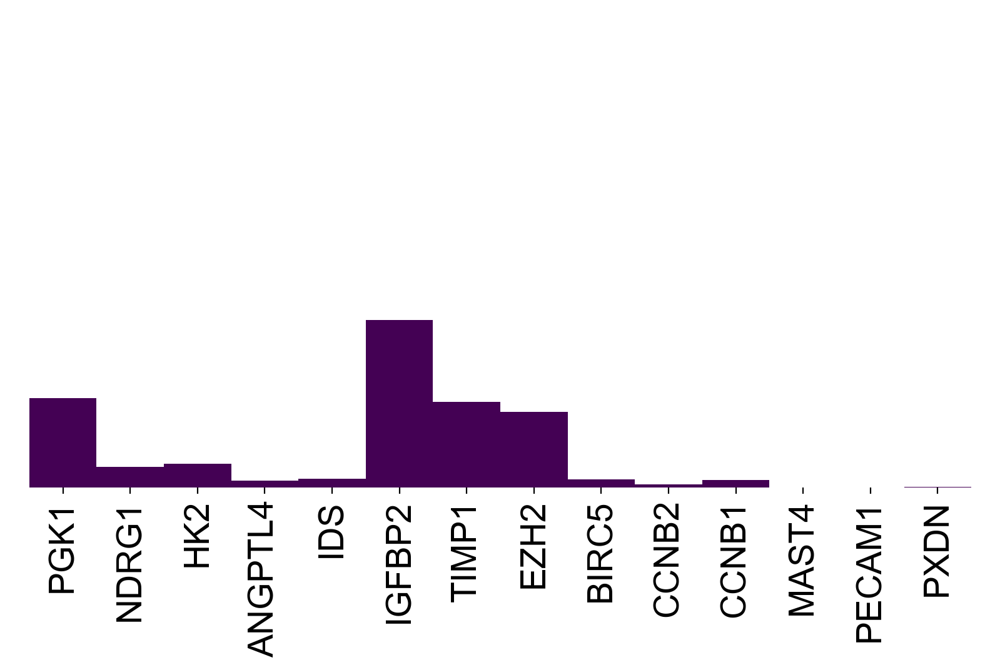

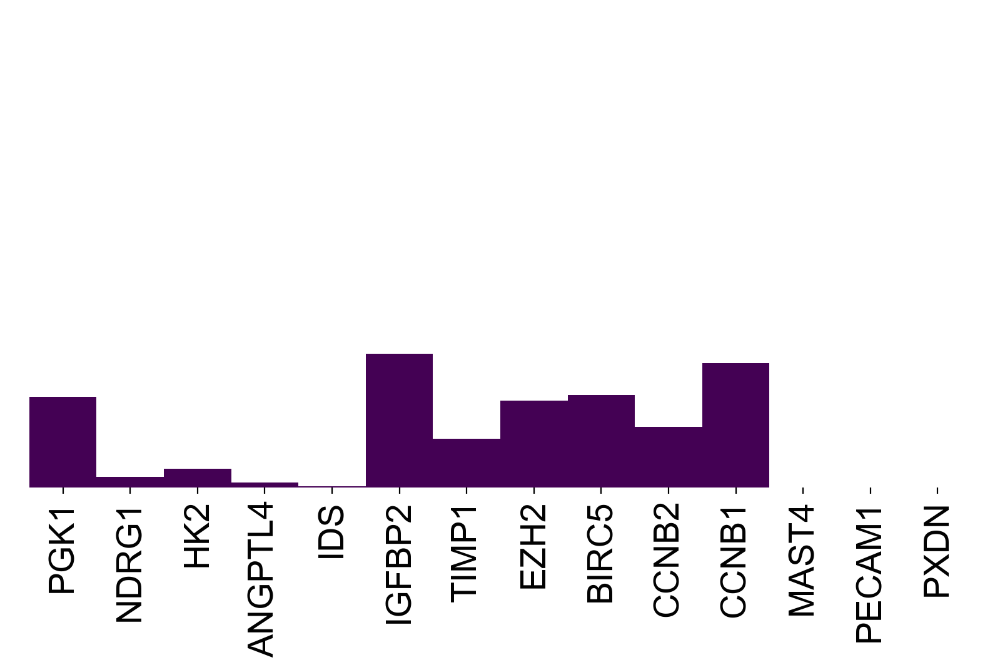

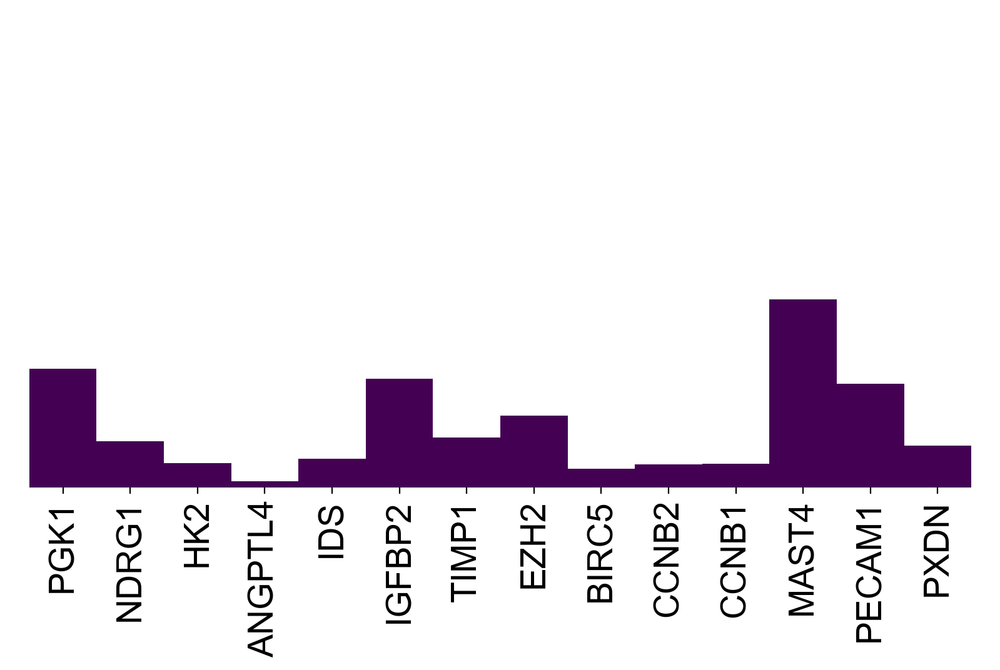

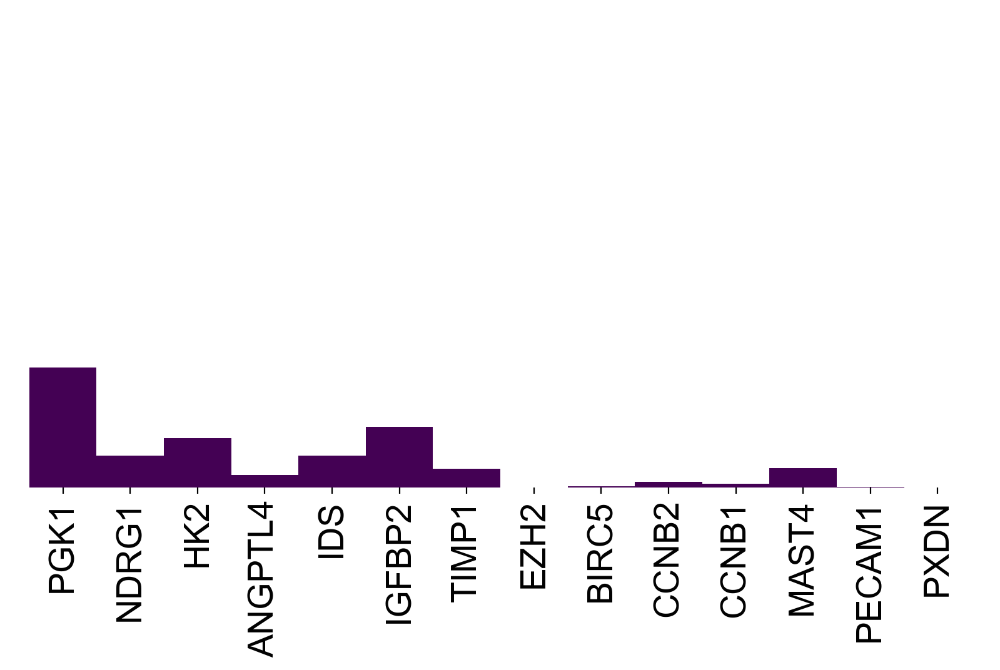

In [23]:
for i in range(adata.obs['class'].nunique()):
        df = pd.DataFrame()
        zone = adata.obs['class'].unique()[i]
        # normalize expression so every gene is from 0 to 1 relative to itself
        normalized_values = (adata[adata.obs['class'] == zone, genes_list].X + np.min(adata[adata.obs['class'] == zone, genes_list].X, axis=0)) / (np.max(adata[adata.obs['class'] == zone, genes_list].X, axis=0)+np.min(adata[adata.obs['class'] == zone, genes_list].X, axis=0))
        # average expression
        expression = np.mean(normalized_values, axis=0)
        # log transform
        df[zone] = expression
        df.index = genes_list
        # reorder to order of genes_list
        df = df.reindex(genes_list)
        # print(df)
        # plot
        df.plot(kind='bar', figsize=(10, 5), width=1, color=['#440154'])


        # remove background grid
        # set y-limit to 2
        plt.ylim(0, 1)
        plt.grid(False)
        # no legend
        plt.legend().remove()
        # remove frame
        plt.box(False)
        # make y ticks 0 to 1
        plt.yticks([])
        # plt.title(zone)



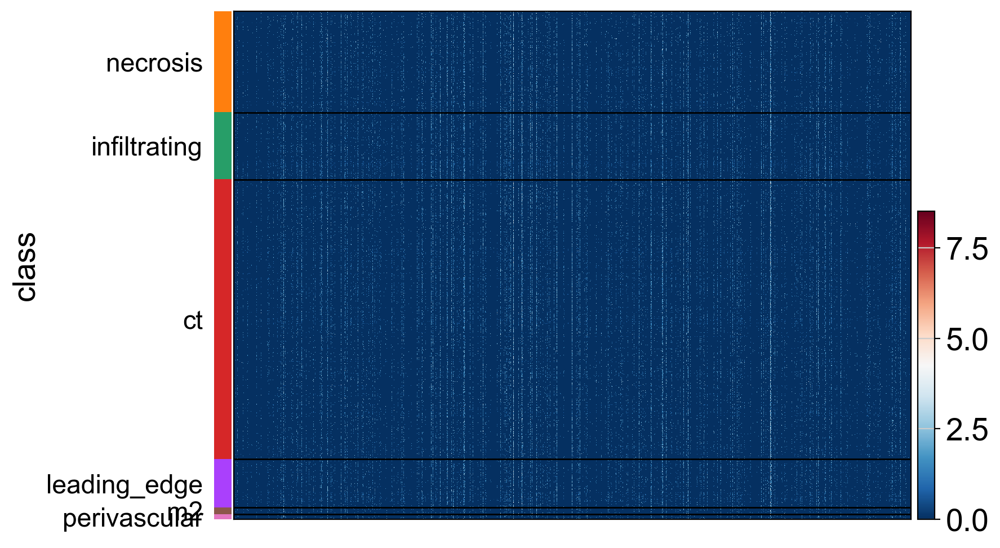

In [24]:
import concurrent.futures

all_genes = adata.var.index
adata_sample = adata.copy()
# remove all genes that have less than 0.2 mean counts
adata_sample = adata_sample[:, adata_sample.var['mean_counts'] > 0.2]



sc.pl.heatmap(adata_sample, var_names=all_genes, groupby='class', cmap='RdBu_r')